In [1]:
from stompy.grid import unstructured_grid, multi_ugrid
import numpy as np
from stompy import utils
from stompy.grid import ugrid
from stompy.plot import plot_wkb
import xarray as xr
import os
import six
import matplotlib.pyplot as plt
%matplotlib notebook

In [2]:
# How to calculate potential energy anomaly?ma

# Looking for the energy required to lift the dense fluid up, push the fresh down.
# Can this be related to a change of center of mass?
# So if I can get an elevation for the center of each layer, then 
# calculate the center of mass with 3D salt, and the center of mass with
# average salt, and then I just need to know the total mass per area, which
# is just waterdepth * rho_avg

# aiming for PE/area, so that's mgh/L2 = M * L/T2 * L / L2 = M/T2
# That's the same as J/m2

In [3]:
fig_dir='fig-unimpaired'

In [4]:
# Depth-average salinity for both
# pe-anomaly for both
# and difference in pe-anomaly?
def calculations(run_dir,mui,force=False):
    t_label=utils.to_datetime(mui.time.values).strftime('%Y-%m-%d')
    
    nc_fn=os.path.join(run_dir,'pe_anom-%s.nc'%(t_label))
    print("Checking for cached",nc_fn)
    if (not force) and os.path.exists(nc_fn):
        ds=xr.open_dataset(nc_fn)
        return ds
    
    print("Will calculate")
    ug=ugrid.UgridXr(mui,
                 layer_vname='mesh2d_layer_z',
                 time_dim=None,
                 face_eta_vname='mesh2d_s1',
                 face_depth_vname='mesh2d_flowelem_bl')
        
    # Could have some caching, but for now things are changing
    # too much to cache 
    rho0=1000
    beta=7.8e-4
    grav=9.8

    ds=mui.grid.write_to_xarray()
    ds['time']=(),mui.time.values
    ds['run']=(),run_dir
    
    print("Getting weights")
    weights,dz,z_center=ug.vertical_averaging_weights(ztop=0,zbottom=0,
                                                      query=['weight','dz','z_center'])
    s_avg=np.nansum( mui.mesh2d_sa1.values * weights, axis=1)
    ds['s_avg']=('face',),s_avg
    s_anom=mui.mesh2d_sa1.values - s_avg[:,None]

    #            L     L (1 +1/psu*) * M/L3  * L/T2 = M / T2
    #pe_mixed=z_center*dz*(1+beta*s_avg[...,None])*rho0 * grav
    #pe_strat=z_center*dz*(1+beta*)*rho0*grav
    pe_anom=np.nansum(z_center*dz*beta*s_anom*rho0*grav,axis=-1)
    ds['pe_anom']=('face',),pe_anom

    wet=mui.mesh2d_waterdepth.values>0.05
    ds['wet']=('face',),wet
    ds.to_netcdf(nc_fn)
    
    return ds

In [12]:
def sixpanel(dss,mus):
    t_label=utils.to_datetime(dss[0].time.values).strftime('%Y-%m-%d')
    
    fig,axs=plt.subplots(2,3,figsize=(9,6))
    for ax in axs.ravel():
        ax.axis('off')
        ax.set_adjustable('datalim')

    g=mus[0].grid
    poly=g.boundary_polygon()

    wet0=dss[0]['wet'].values
    wet1=dss[1]['wet'].values 

    savg0=dss[0]['s_avg'].values
    savg1=dss[1]['s_avg'].values
    ccoll0=g.plot_cells(values=savg0,mask=wet0,cmap='turbo',ax=axs[0,0],clim=[0,35])
    ccoll1=g.plot_cells(values=savg1,mask=wet1,cmap='turbo',ax=axs[0,1],clim=[0,35])
    ccoll2=g.plot_cells(values=savg1-savg0,mask=wet0&wet1,
                        cmap='coolwarm',ax=axs[0,2],clim=[-5,5])

    anom0=dss[0]['pe_anom'].values
    anom1=dss[1]['pe_anom'].values    
    ccoll3=g.plot_cells(values=-anom0,cmap='turbo',mask=wet0,ax=axs[1,0],clim=[0,150])
    ccoll4=g.plot_cells(values=-anom1,cmap='turbo',mask=wet1,ax=axs[1,1],clim=[0,150])

    ccoll5=g.plot_cells(values=-(anom1-anom0),cmap='coolwarm',ax=axs[1,2],
                        clim=[-50,50])

    zoom=(551804.4397932757, 553251.3755695953, 4123658.5886580567, 4125139.753022634)

    for ax in axs.ravel():
        plot_wkb.plot_wkb(poly,fc='0.9',ec='none',zorder=-2,ax=ax)
        ax.axis(zoom)

    fig.subplots_adjust(left=0.01,right=0.99,top=0.99,bottom=0.01,hspace=0.05,wspace=0.02)

    cax_salt=fig.add_axes([0.35,0.5,0.014,0.3])
    cax_pe  =fig.add_axes([0.35,0.0,0.014,0.3])
    cax_dsalt=fig.add_axes([0.71,0.5,0.014,0.3])
    cax_dpe =fig.add_axes([0.71,0.0,0.014,0.3])

    plt.colorbar(ccoll0,cax=cax_salt,label='ppt')
    plt.colorbar(ccoll3,cax=cax_pe,label='J/m$^2$')
    plt.colorbar(ccoll2,cax=cax_dsalt,label=r'$\Delta$ ppt')
    plt.colorbar(ccoll5,cax=cax_dpe,label=r'$\Delta$ J/m$^2$')

    run_dirs=[ds.run.item() for ds in dss]
    label0,label1=utils.distinct_substrings(run_dirs)

    fig.text(0.15+0.05,0.5,label0,va='center',ha='center')
    fig.text(0.45+0.11,0.5,label1,va='center',ha='center')
    fig.text(0.85+0.03,0.5,f"{label1}-{label0}",va='center',ha='center')
    fig.text(0.01,0.99,t_label,va='top')
    
    img_fn=('pe_anom-' 
            + run_dirs[0].replace(label0,f'{label0}-{label1}') 
            + f"{t_label}.png")
    # colorbars
    print("Saving to",img_fn)
    fig.savefig(os.path.join(fig_dir,img_fn),
                dpi=150)


In [13]:
# What are interesting time to look at?
# For as-built, impaired v unimpaired 2016-09-10 is a point of substantial difference
# 2016-10-10 probably also decent
# 2016-12-07 for a good pre-breach snapshot

target_times=[np.datetime64("2016-09-10"),
              np.datetime64("2016-10-10"),
              np.datetime64("2016-12-07")]

def plot_pe_anom_comparison(run_dirs,target_times=target_times):
    labels=utils.distinct_substrings(run_dirs)
    labels=[l.title() for l in labels]
    print("Building multi-ugrids")
    mus=[multi_ugrid.MultiUgrid(os.path.join(run_dir,'DFM_OUTPUT_flowfm/*_map.nc'))
         for run_dir in run_dirs]

    for t in target_times:
        muis=[mu.sel(time=t,method='nearest')
              for mu in mus]

        t_label=utils.to_datetime(muis[0].time.values).strftime('%Y-%m-%d')

        print("Running PE anomaly calculations")
        dss=[]
        for i,mui in enumerate(muis):
            ds=calculations(run_dirs[i],mui)
            dss.append(ds)

        print("plotting")
        sixpanel(dss,mus)


Processing pair ['data_salt_filling-v04_asbuilt_impaired', 'data_salt_filling-v04_asbuilt_unimpaired']
Building multi-ugrids


INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing o

INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extra

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides 

Running PE anomaly calculations
Checking for cached data_salt_filling-v04_asbuilt_impaired/pe_anom-2016-09-11.nc
Checking for cached data_salt_filling-v04_asbuilt_unimpaired/pe_anom-2016-09-11.nc
plotting


<IPython.core.display.Javascript object>


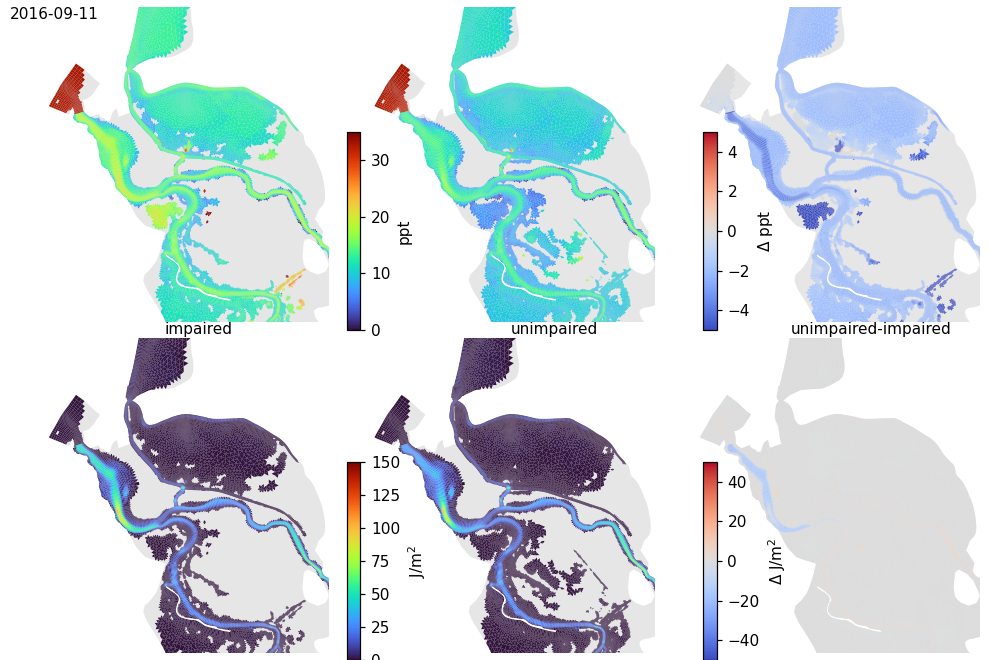

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_asbuilt_impaired-unimpaired2016-09-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_asbuilt_impaired/pe_anom-2016-10-11.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


Checking for cached data_salt_filling-v04_asbuilt_unimpaired/pe_anom-2016-10-11.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


plotting


<IPython.core.display.Javascript object>


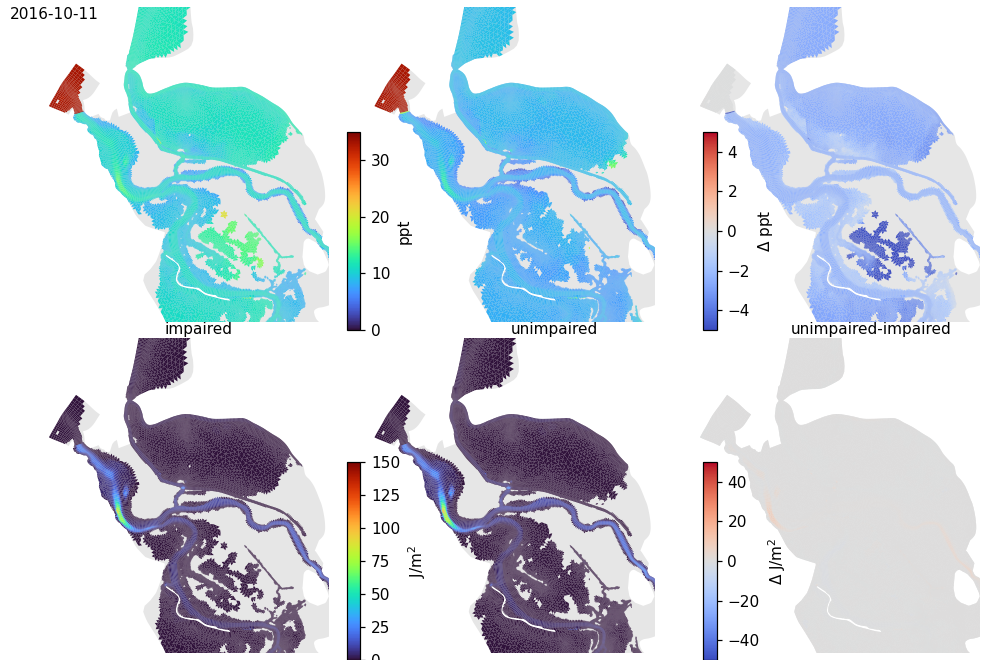

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_asbuilt_impaired-unimpaired2016-10-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_asbuilt_impaired/pe_anom-2016-12-08.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


Checking for cached data_salt_filling-v04_asbuilt_unimpaired/pe_anom-2016-12-08.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


plotting


<IPython.core.display.Javascript object>


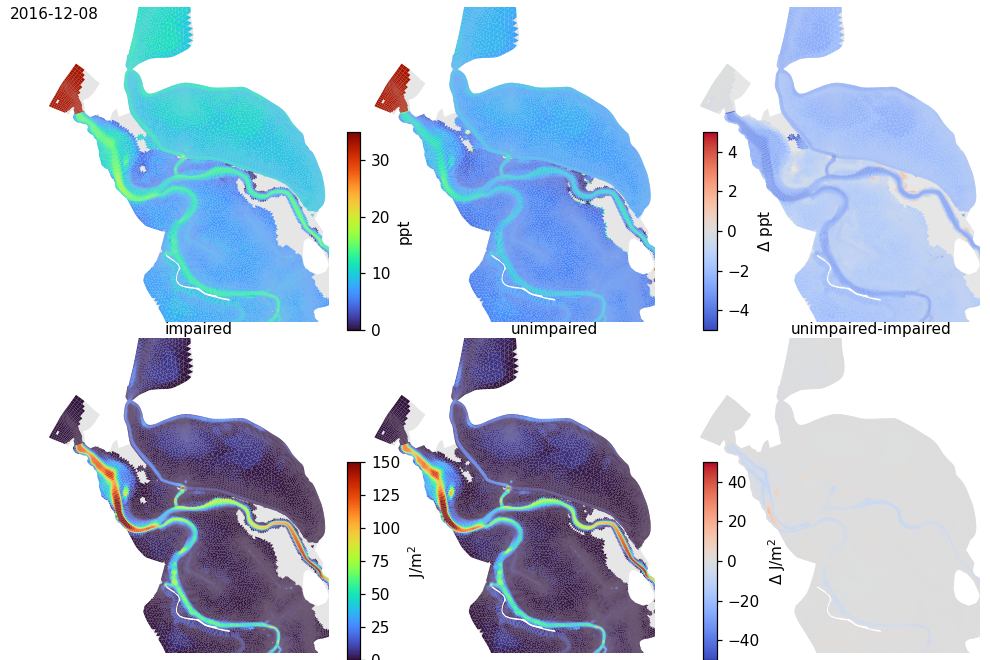

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_asbuilt_impaired-unimpaired2016-12-08.png
Processing pair ['data_salt_filling-v04_existing_impaired', 'data_salt_filling-v04_existing_unimpaired']
Building multi-ugrids


INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing o

INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extra

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides 

Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_impaired/pe_anom-2016-09-11.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


Checking for cached data_salt_filling-v04_existing_unimpaired/pe_anom-2016-09-11.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


plotting


<IPython.core.display.Javascript object>


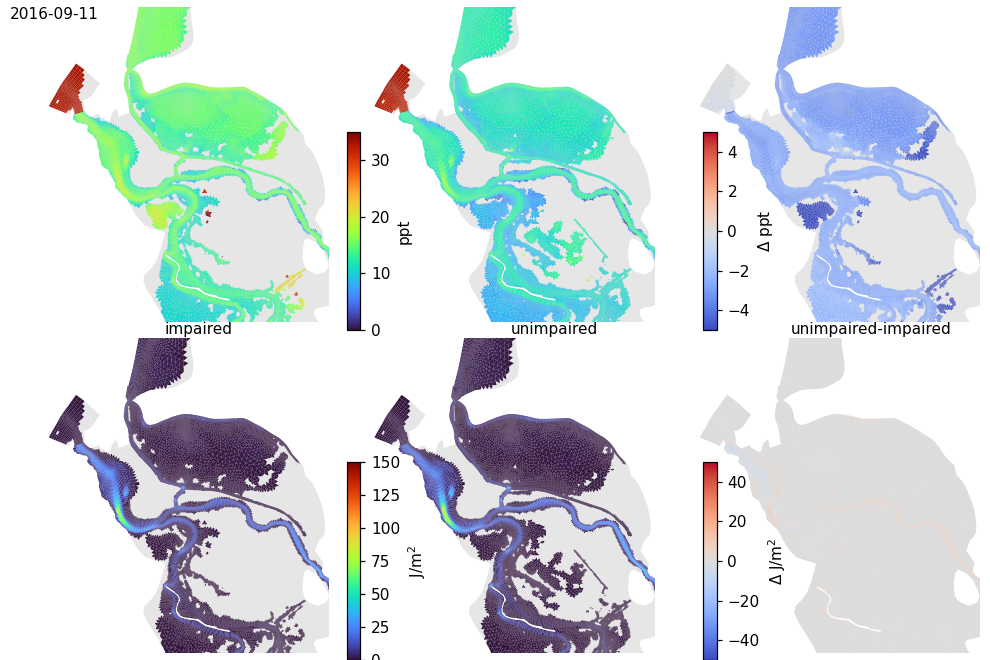

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing_impaired-unimpaired2016-09-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_impaired/pe_anom-2016-10-11.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


Checking for cached data_salt_filling-v04_existing_unimpaired/pe_anom-2016-10-11.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


plotting


<IPython.core.display.Javascript object>


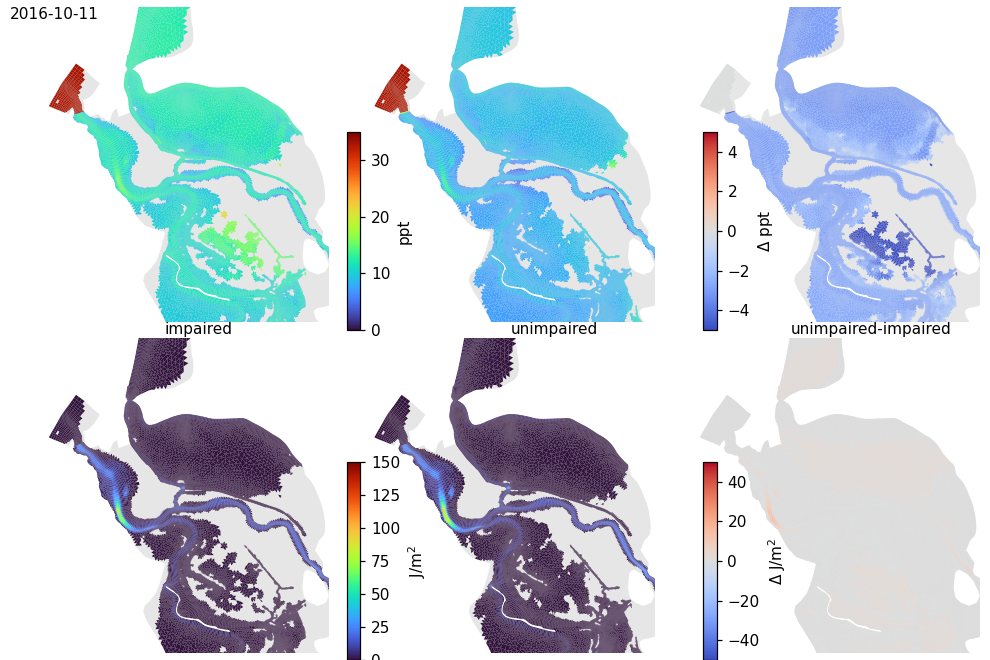

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing_impaired-unimpaired2016-10-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_impaired/pe_anom-2016-12-08.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


Checking for cached data_salt_filling-v04_existing_unimpaired/pe_anom-2016-12-08.nc
Will calculate
Getting weights


/home/rustyh/src/stompy/stompy/grid/ugrid.py:801: RuntimeWarning: invalid value encountered in true_divide
  result = all_dz / np.sum(all_dz,axis=-1)[...,None]


plotting


<IPython.core.display.Javascript object>


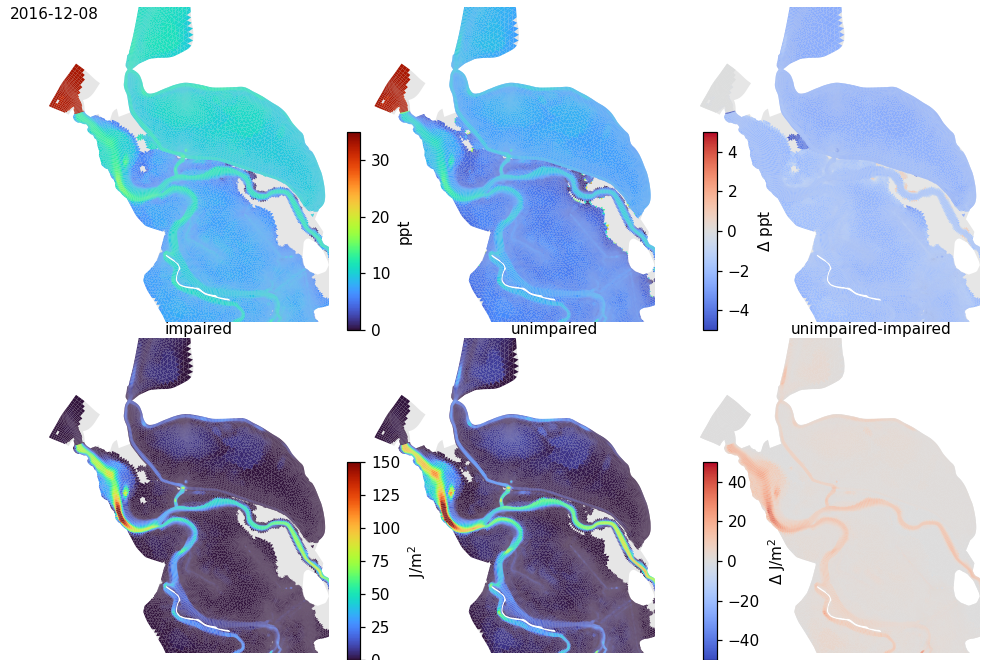

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing_impaired-unimpaired2016-12-08.png
Processing pair ['data_salt_filling-v04_existing_impaired', 'data_salt_filling-v04_asbuilt_impaired']
Building multi-ugrids


INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing o

INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extra

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides 

Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_impaired/pe_anom-2016-09-11.nc
Checking for cached data_salt_filling-v04_asbuilt_impaired/pe_anom-2016-09-11.nc
plotting


<IPython.core.display.Javascript object>


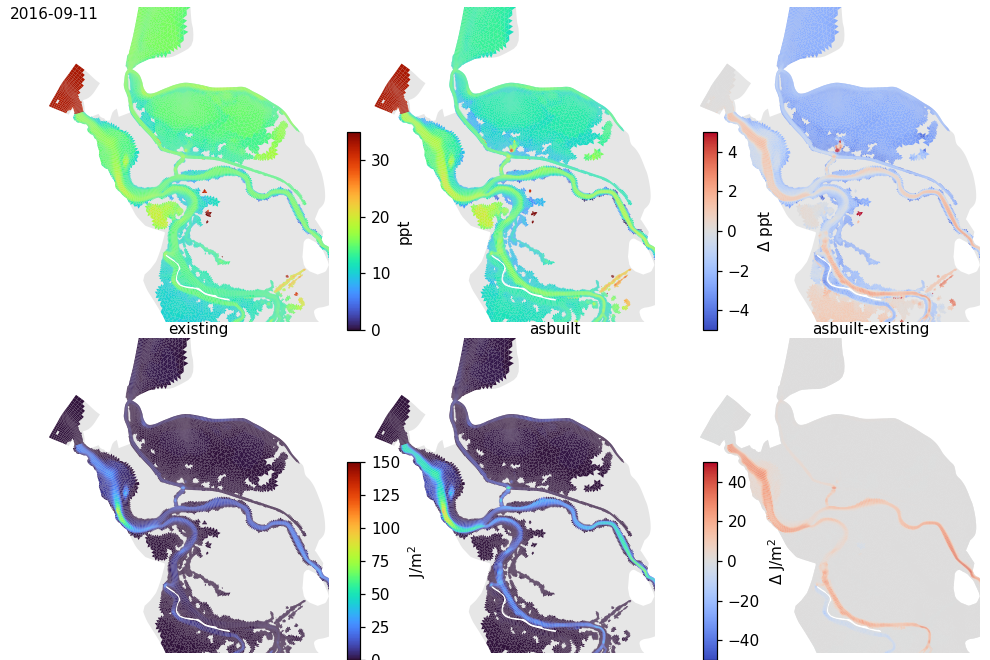

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing-asbuilt_impaired2016-09-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_impaired/pe_anom-2016-10-11.nc
Checking for cached data_salt_filling-v04_asbuilt_impaired/pe_anom-2016-10-11.nc
plotting


<IPython.core.display.Javascript object>


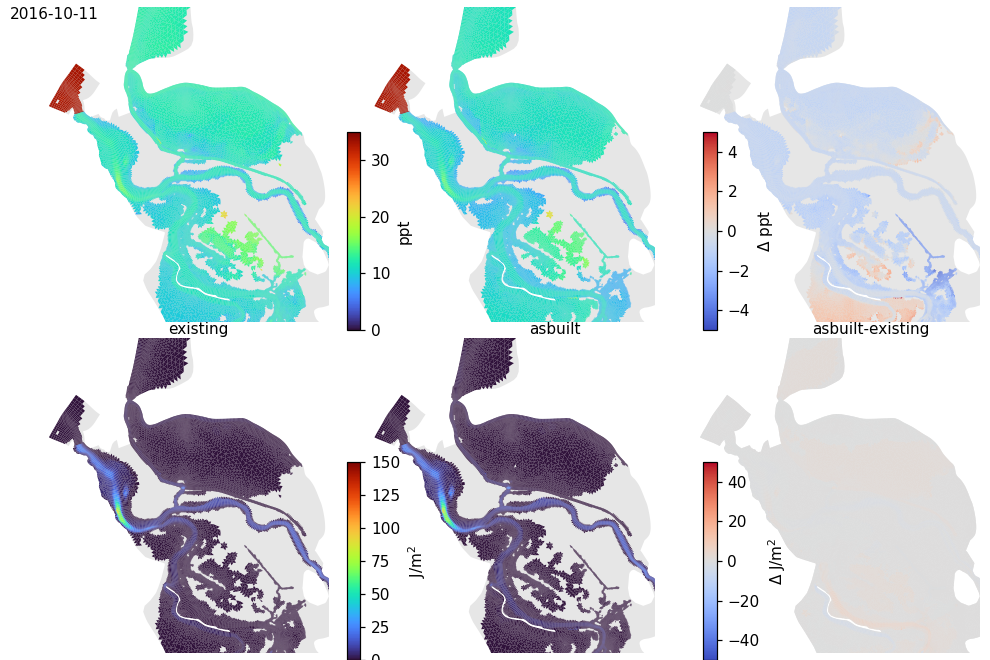

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing-asbuilt_impaired2016-10-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_impaired/pe_anom-2016-12-08.nc
Checking for cached data_salt_filling-v04_asbuilt_impaired/pe_anom-2016-12-08.nc
plotting


<IPython.core.display.Javascript object>


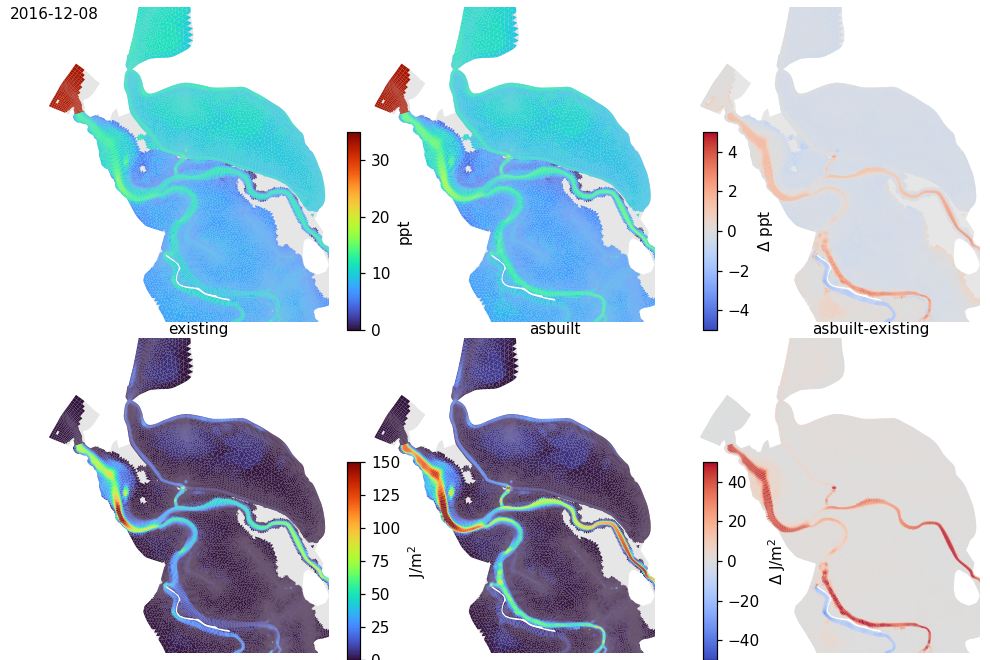

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing-asbuilt_impaired2016-12-08.png
Processing pair ['data_salt_filling-v04_existing_unimpaired', 'data_salt_filling-v04_asbuilt_unimpaired']
Building multi-ugrids


INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Remo

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing o

INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extracting grid boundary
INFO:UnstructuredGrid:Regenerating edges
INFO:UnstructuredGrid:Removing orphaned nodes
INFO:UnstructuredGrid:0 nodes found to be orphans
INFO:UnstructuredGrid:Removing duplicate nodes
INFO:UnstructuredGrid:Renumbering nodes
INFO:UnstructuredGrid:Renumbering edges
INFO:UnstructuredGrid:Extra

INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides is okay (4)
INFO:UnstructuredGrid:max_sides 

Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_unimpaired/pe_anom-2016-09-11.nc
Checking for cached data_salt_filling-v04_asbuilt_unimpaired/pe_anom-2016-09-11.nc
plotting


<IPython.core.display.Javascript object>


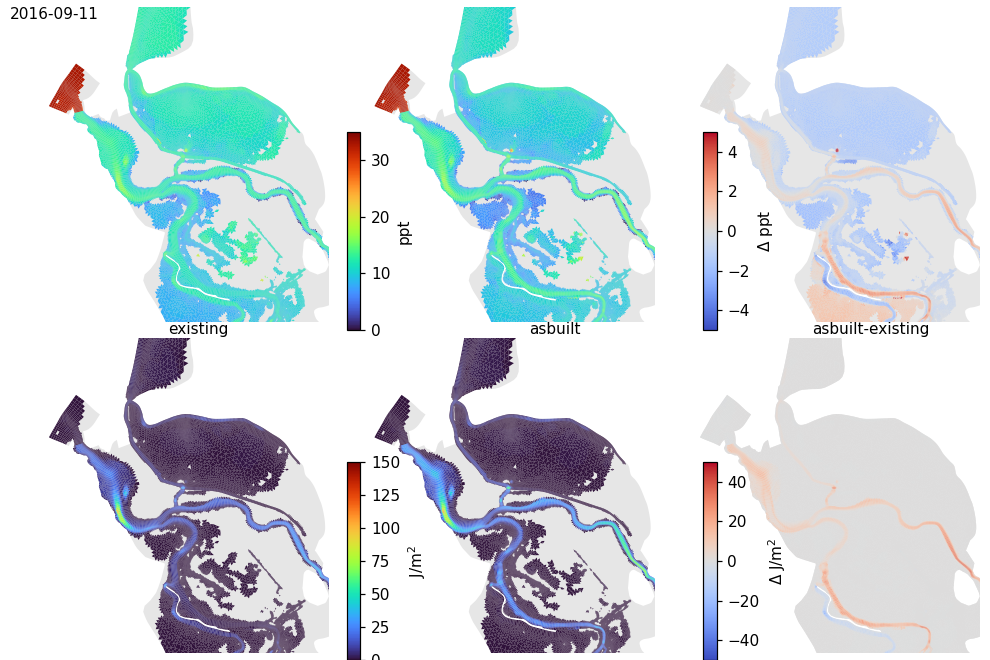

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing-asbuilt_unimpaired2016-09-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_unimpaired/pe_anom-2016-10-11.nc
Checking for cached data_salt_filling-v04_asbuilt_unimpaired/pe_anom-2016-10-11.nc
plotting


<IPython.core.display.Javascript object>


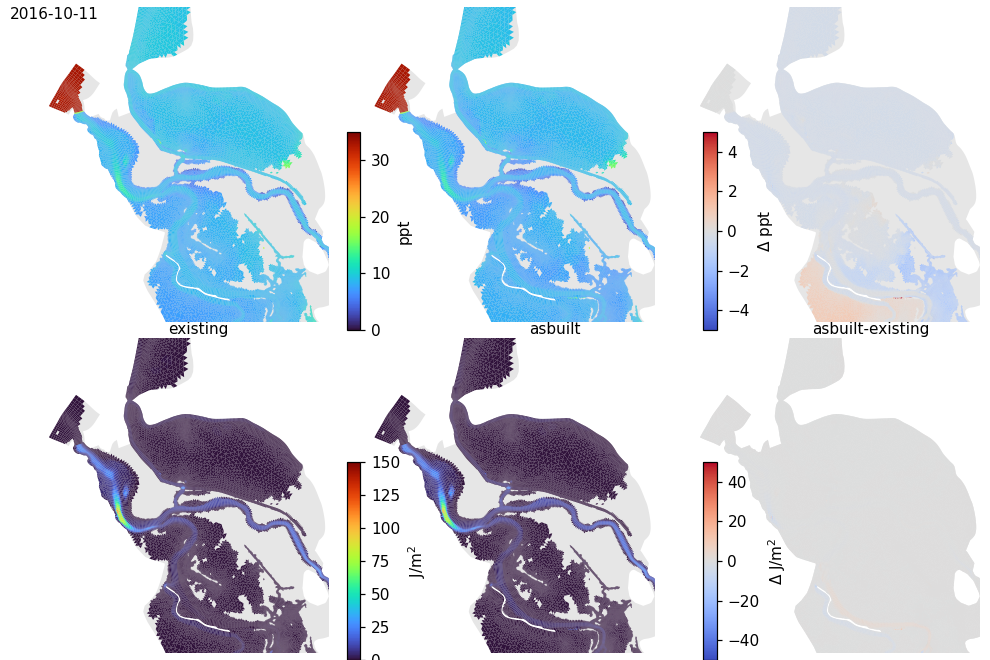

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing-asbuilt_unimpaired2016-10-11.png
Running PE anomaly calculations
Checking for cached data_salt_filling-v04_existing_unimpaired/pe_anom-2016-12-08.nc
Checking for cached data_salt_filling-v04_asbuilt_unimpaired/pe_anom-2016-12-08.nc
plotting


<IPython.core.display.Javascript object>


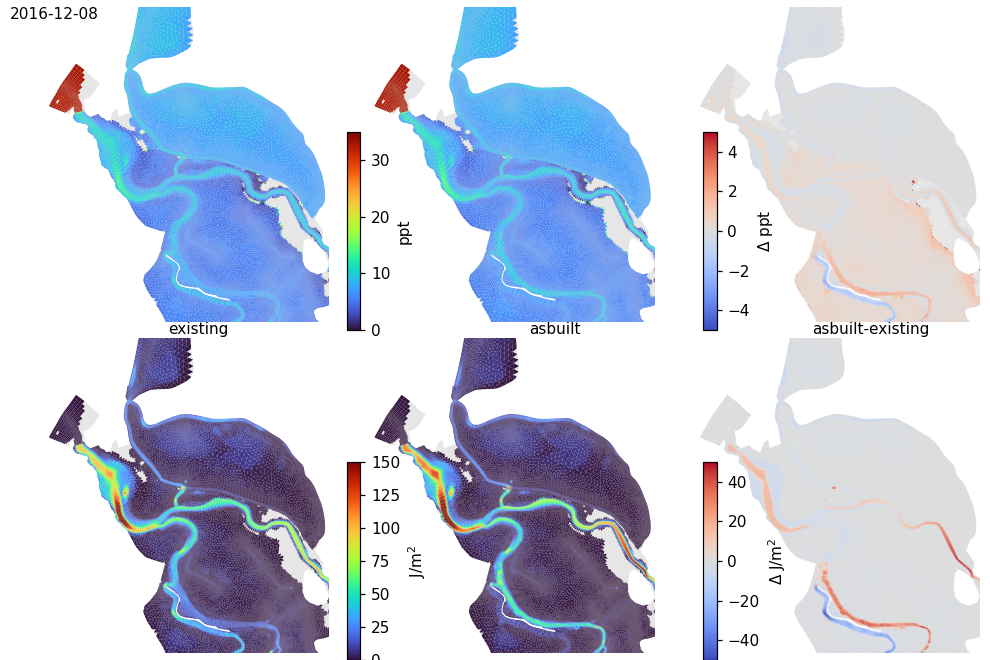

INFO:join_features:0 open strings, 4 simple polygons
INFO:join_features:Building index
INFO:join_features:done building index
INFO:join_features:Examining largest poly left with area=2042877.045454, 3 potential interiors


Saving to pe_anom-data_salt_filling-v04_existing-asbuilt_unimpaired2016-12-08.png


In [14]:
pairs=[
    ['data_salt_filling-v04_asbuilt_impaired',
     'data_salt_filling-v04_asbuilt_unimpaired'],
    ['data_salt_filling-v04_existing_impaired',
     'data_salt_filling-v04_existing_unimpaired'],    
    ['data_salt_filling-v04_existing_impaired',
     'data_salt_filling-v04_asbuilt_impaired'],    
    ['data_salt_filling-v04_existing_unimpaired',
     'data_salt_filling-v04_asbuilt_unimpaired'],    
      ]

for run_dirs in pairs:
    print("Processing pair",run_dirs)
    plot_pe_anom_comparison(run_dirs)
